<a href="https://colab.research.google.com/github/UmarQayyum16/CrackDetective-Concrete-Crack-Image-Classification-with-AI/blob/main/Capstone_1_Crack_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
#1. Import packages
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, optimizers, losses, callbacks, applications, models
import numpy as np
import matplotlib.pyplot as plt
import os, datetime

In [45]:
#2. Data loading

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Specify the source and destination paths
zip_file_path = "/content/drive/MyDrive/Capstone AI06 Umar Qayyum/Concrete Crack Images for Classification.zip"
destination_path = "/content/dataset"

# Unzip the file
!unzip "{zip_file_path}" -d "{destination_path}"

Mounted at /content/drive
Archive:  /content/drive/MyDrive/Capstone AI06 Umar Qayyum/Concrete Crack Images for Classification.zip
replace /content/dataset/Concrete Crack Images for Classification/Negative/00001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [46]:
# Verify data upload
!ls "{destination_path}"

'Concrete Crack Images for Classification'


In [47]:
import os

# Specify the path to the 'Concrete Crack Images for Classification' directory
directory_path = "/content/dataset/Concrete Crack Images for Classification"

# List all files in the directory
files = os.listdir(directory_path)

# Display the list of files
print("Files in the 'Concrete Crack Images for Classification' directory:")
print(files)

Files in the 'Concrete Crack Images for Classification' directory:
['Positive', 'Negative']


In [48]:
#3. Split dataset
import os
import shutil
from sklearn.model_selection import train_test_split

# Paths
original_data_path = "/content/dataset/Concrete Crack Images for Classification"
output_path = "/content/dataset_split"

# Create directories for train, test, and validation sets
train_path = os.path.join(output_path, "train")
test_path = os.path.join(output_path, "test")
val_path = os.path.join(output_path, "validation")

for path in [train_path, test_path, val_path]:
    for category in ["Negative", "Positive"]:
        os.makedirs(os.path.join(path, category), exist_ok=True)

# Function to split and move files
def split_and_move(category, file_list, dest_path):
    train, test = train_test_split(file_list, test_size=0.2, random_state=42)
    val, test = train_test_split(test, test_size=0.5, random_state=42)

    for file_name in train:
        source = os.path.join(original_data_path, category, file_name)
        destination = os.path.join(dest_path, "train", category, f"image_{category.lower()}_{file_name}")
        shutil.copyfile(source, destination)

    for file_name in test:
        source = os.path.join(original_data_path, category, file_name)
        destination = os.path.join(dest_path, "test", category, f"image_{category.lower()}_{file_name}")
        shutil.copyfile(source, destination)

    for file_name in val:
        source = os.path.join(original_data_path, category, file_name)
        destination = os.path.join(dest_path, "validation", category, f"image_{category.lower()}_{file_name}")
        shutil.copyfile(source, destination)

# Get the list of files for each category
negative_files = os.listdir(os.path.join(original_data_path, "Negative"))
positive_files = os.listdir(os.path.join(original_data_path, "Positive"))

# Split and move files for Negative and Positive categories
split_and_move("Negative", negative_files, output_path)
split_and_move("Positive", positive_files, output_path)


In [49]:
# Load and inspect
import tensorflow as tf
import matplotlib.pyplot as plt

# Set the paths for train, test, and validation directories
train_dir = "/content/dataset_split/train"
test_dir = "/content/dataset_split/test"
validation_dir = "/content/dataset_split/validation"

# Set batch size and image size
BATCH_SIZE = 32
IMG_SIZE = (160, 160)

# Create image datasets using tf.keras.utils.image_dataset_from_directory
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE
)

test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    validation_dir,
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE
)

Found 32000 files belonging to 2 classes.
Found 4000 files belonging to 2 classes.
Found 4000 files belonging to 2 classes.


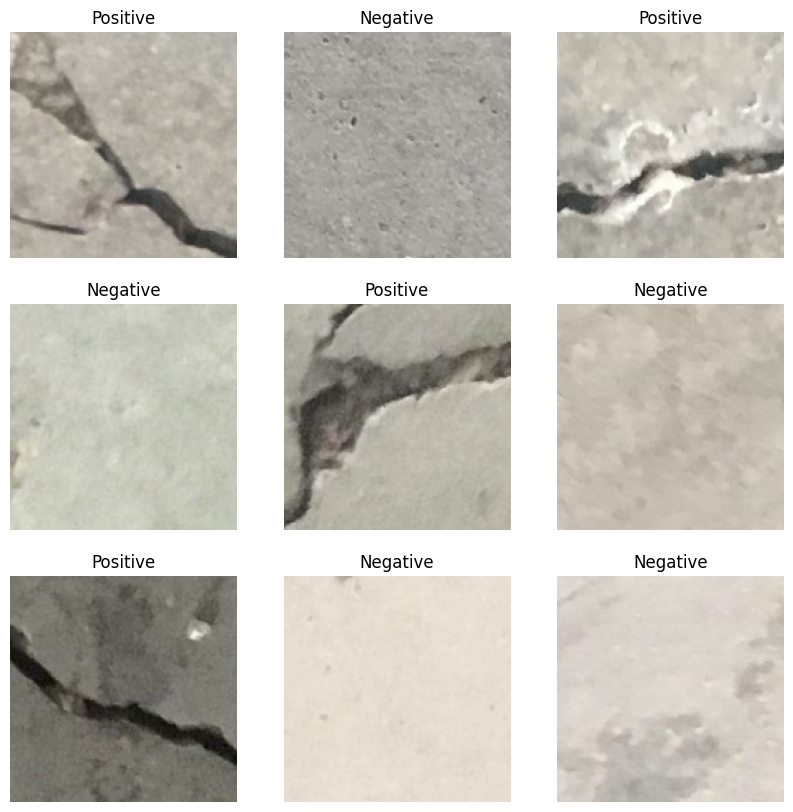

In [50]:
#3. Inspect some data examples
class_names = train_dataset.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis('off')
        plt.grid('off')

plt.show()

In [51]:
#4. Covert the tensorflow datasets into PrefetchDataset
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

In [52]:
#5. Create a sequential model for image augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
])


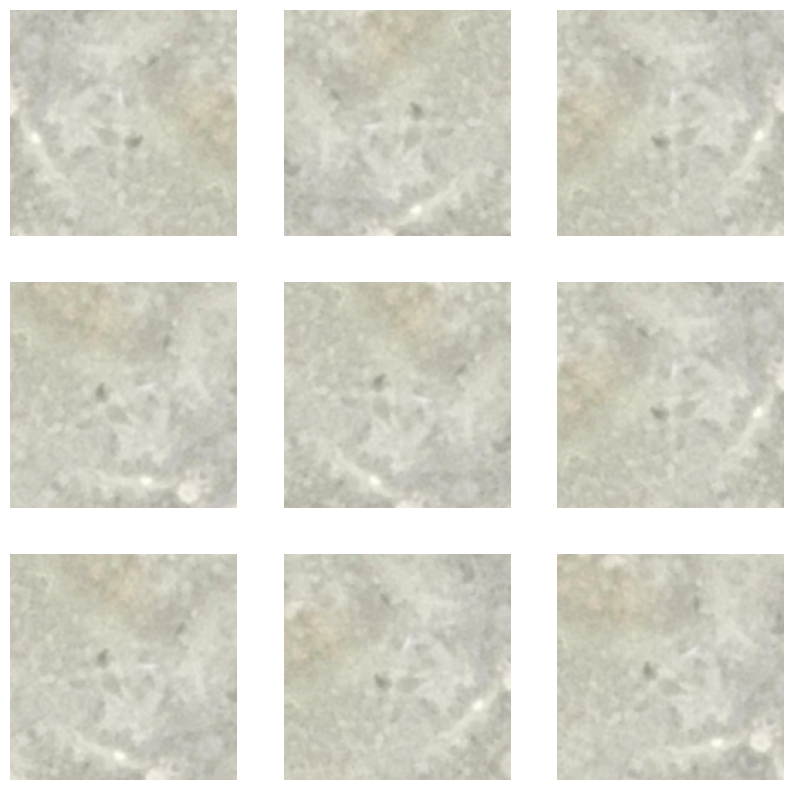

In [53]:
#6. Repeatedly apply image augmentation on a single image
for image, _ in train_dataset.take(1):
    first_image = image[0]
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')
        plt.grid('off')
plt.show()

In [54]:
#7. Define a layer for data normalization
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [55]:
#8. Transfer learning model pipeline
# (A) Load the pretrained model using keras.applications
IMG_SHAPE = IMG_SIZE + (3,)
base_model = applications.MobileNetV2(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')

# (B) Freeze the entire feature extractor
base_model.trainable = False

# (C) Create global average pooling layer
global_avg = layers.GlobalAveragePooling2D()

# (D) Create the output layer
output_layer = layers.Dense(len(class_names), activation='softmax')

# (E) Build the entire pipeline using Functional API
inputs = keras.Input(shape=IMG_SHAPE)
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_avg(x)
x = layers.Dropout(0.3)(x)
outputs = output_layer(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv_1 (TFOpLam  (None, 160, 160, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_1 (TFOpLa  (None, 160, 160, 3)       0         
 mbda)                                                           
                                                                 
 mobilenetv2_1.00_160 (Func  (None, 5, 5, 1280)        2257984   
 tional)                                                         
                                                           

In [56]:
#9. Compile the model
optimizer = optimizers.Adam(learning_rate=0.0001)
loss = losses.SparseCategoricalCrossentropy()
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

In [57]:
#10. Model Training
# Create a TensorBoard callback object
PATH = os.getcwd()
logpath = os.path.join(PATH, "tensorboard_log", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tb = callbacks.TensorBoard(logpath)

# Evaluate the model before training
model.evaluate(test_dataset)


125/125 [==============================] - 5s 28ms/step - loss: 0.7226 - accuracy: 0.5163


[0.7225873470306396, 0.5162500143051147]

In [58]:
#11. Model training
early_stopping = callbacks.EarlyStopping(patience=2)
EPOCHS = 10
history = model.fit(train_dataset,
                    validation_data=validation_dataset,
                    epochs=EPOCHS,
                    callbacks=[tb, early_stopping])


Epoch 1/10
1000/1000 [==============================] - 50s 46ms/step - loss: 0.0575 - accuracy: 0.9830 - val_loss: 0.0088 - val_accuracy: 0.9977
Epoch 2/10
1000/1000 [==============================] - 39s 39ms/step - loss: 0.0117 - accuracy: 0.9967 - val_loss: 0.0057 - val_accuracy: 0.9983
Epoch 3/10
1000/1000 [==============================] - 38s 38ms/step - loss: 0.0100 - accuracy: 0.9967 - val_loss: 0.0044 - val_accuracy: 0.9987
Epoch 4/10
1000/1000 [==============================] - 38s 37ms/step - loss: 0.0085 - accuracy: 0.9973 - val_loss: 0.0042 - val_accuracy: 0.9985
Epoch 5/10
1000/1000 [==============================] - 37s 37ms/step - loss: 0.0080 - accuracy: 0.9975 - val_loss: 0.0037 - val_accuracy: 0.9985
Epoch 6/10
1000/1000 [==============================] - 39s 39ms/step - loss: 0.0076 - accuracy: 0.9979 - val_loss: 0.0033 - val_accuracy: 0.9987
Epoch 7/10
1000/1000 [==============================] - 37s 37ms/step - loss: 0.0070 - accuracy: 0.9978 - val_loss: 0.0031 -

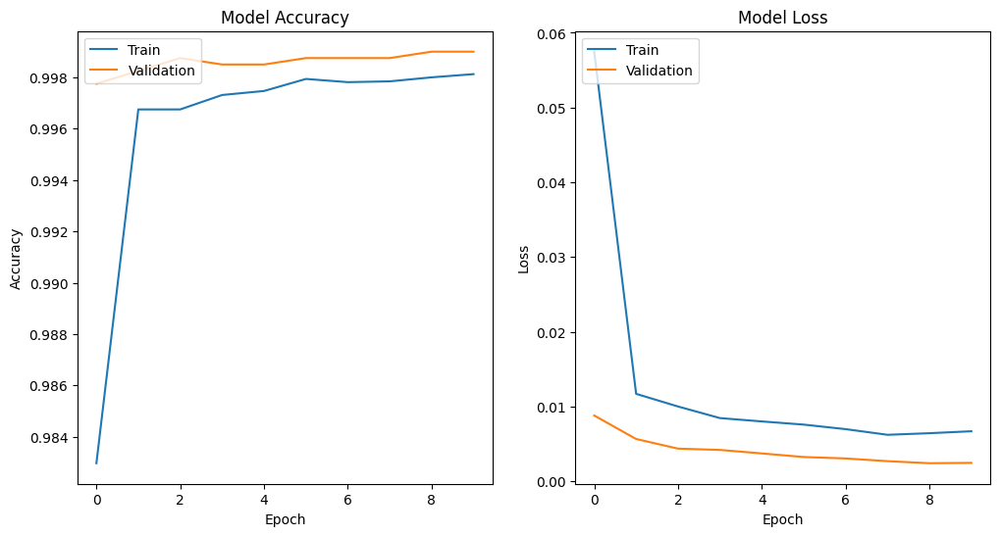

In [59]:
# Plot training history (e.g., accuracy and loss)
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

# Save the plot as an image
plt.savefig('training_performance.png')

# Show the plot (optional)
plt.show()

In [60]:
#12. Evaluate the model with test data
model.evaluate(test_dataset)

125/125 [==============================] - 4s 30ms/step - loss: 0.0037 - accuracy: 0.9987


[0.0037290570326149464, 0.9987499713897705]

In [1]:
#13. Fine tune the model
fine_tune_at = 100
#Freeze all the layers before the 'fine_tune_at' layer
base_model.trainable =True
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
base_model.summary()

NameError: ignored

In [83]:
#14. Compile the model
optimizer = optimizers.RMSprop(learning_rate=0.00001)
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

In [ ]:
#15. Model fine tune training
fine_tune_epoch = 10
total_epoch = EPOCHS + fine_tune_epoch
history_fine = model.fit(train_dataset,
                         validation_data = validation_dataset,
                         epochs = total_epoch,
                         initial_epoch=history.epoch[-1],
                         callbacks =[tb,early_stopping])

Epoch 10/20
 745/1000 [=====================>........] - ETA: 11s - loss: 0.0023 - accuracy: 0.9995

In [ ]:
#Evaluate the model with test data
model.evaluate(test_dataset)

In [ ]:
# Plot and save performance metrics for initial training
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Initial Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Initial Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.savefig('initial_training_performance.png')
plt.show()

# Plot and save performance metrics for fine-tuning
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_fine.history['accuracy'])
plt.plot(history_fine.history['val_accuracy'])
plt.title('Fine-tuning Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history_fine.history['loss'])
plt.plot(history_fine.history['val_loss'])
plt.title('Fine-tuning Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.savefig('fine_tuning_performance.png')
plt.show()

# Download the saved images
from google.colab import files
files.download('initial_training_performance.png')
files.download('fine_tuning_performance.png')


In [65]:
#16. Deployment
#(A) Retrieve a batch of images from test data and perform prediction
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions =model.predict_on_batch(image_batch)
# %%
#(B) Display results in matplotlib
prediction_indexes = np.argmax(predictions, axis=1)

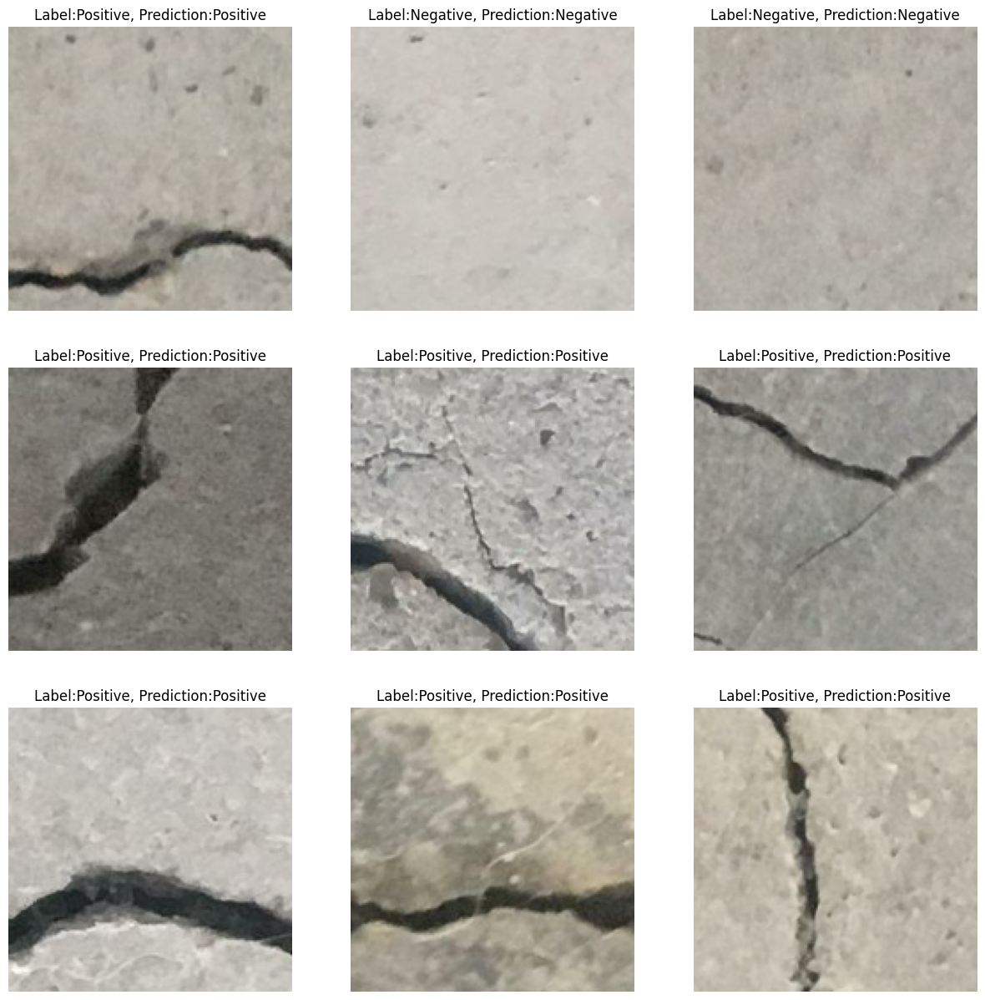

In [66]:
# Create a label map for the classes
label_map = {i: names for i, names in enumerate(class_names)}
prediction_label = [label_map[i] for i in prediction_indexes]
label_class_list = [label_map[i] for i in label_batch]

plt.figure(figsize=(15,15))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))
    plt.title(f"Label:{label_class_list[i]}, Prediction:{prediction_label[i]}")
    plt.axis('off')
    plt.grid('off')

In [67]:
#17. Save model in .h5 format
from tensorflow.keras.models import load_model

# Save the trained model in .h5 format
model.save("concrete_crack_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [68]:
# List files in the current directory
%ls

concrete_crack_model.h5  drive/                  tensorboard_log/
dataset/                 model_architecture.png  training_performance.png
dataset_split/           sample_data/            training_plot.png


In [69]:
import os

h5_model_path = "concrete_crack_model.h5"

# Check if the file exists
if os.path.exists(h5_model_path):
    print(f"The HDF5 format model ({h5_model_path}) has been saved.")
else:
    print(f"The HDF5 format model ({h5_model_path}) does not exist.")

The HDF5 format model (concrete_crack_model.h5) has been saved.


In [ ]:
# Download .h5 format file
from google.colab import files

# Provide the path to the saved model
files.download('concrete_crack_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Use TensorBoard to visualize and save the training process

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Start TensorBoard
%tensorboard --logdir=$logpath


<IPython.core.display.Javascript object>

Visualize architecture

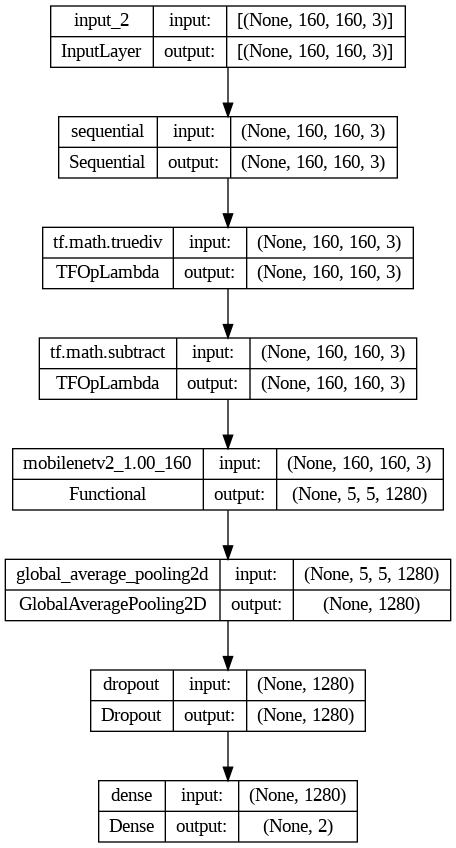

In [ ]:
from tensorflow.keras.utils import plot_model
# Visualize the model architecture and save it as a .png file
plot_model(model, to_file='model_architecture.png', show_shapes=True)
